# Goal Kick Animation 2 — Merged Feature Dataset + Cumulative OBV Overlay

Selects a sequence from `goal_kick_features.parquet` (the fully merged feature table) and renders a **two-panel** animation:
- **Left** — pitch tracking: players + ball with trails, coloured by team
- **Right** — cumulative OBV chart (for vs against the possession team) building up in real time alongside the play

In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from mplsoccer import Pitch

PROJECT_ROOT   = Path('../')
FEATURES_FILE  = PROJECT_ROOT / 'data' / 'feature_engineering' / 'goal_kick_features.parquet'
SEQUENCES_FILE = PROJECT_ROOT / 'data' / 'feature_engineering' / 'goal_kick_sequences.parquet'

features = pd.read_parquet(FEATURES_FILE)
seqs_raw  = pd.read_parquet(SEQUENCES_FILE)

print(f'Feature table : {features.shape}')
print(f'Sequences     : {seqs_raw["goal_kick_id"].nunique():,} goal kicks')

Feature table : (5593, 25)
Sequences     : 5,593 goal kicks


## Select sequence
Pick the goal kick with the highest `obv_total_seq` that also reached the final third.

In [2]:
SAMPLE_ID = int(
    features[features['final_third_entry'] == True]
    .sort_values('obv_total_seq', ascending=False)
    .iloc[0]['goal_kick_id']
)

row = features[features['goal_kick_id'] == SAMPLE_ID].iloc[0]
seq = seqs_raw[seqs_raw['goal_kick_id'] == SAMPLE_ID].copy()

print(f'goal_kick_id          : {SAMPLE_ID}')
print(f'Possession team       : {row["possession_team_name"]} (Period {row["period"]})')
print(f'OBV total             : {row["obv_total_seq"]:.4f}')
print(f'Progressive passes    : {row["n_progressive_passes"]}')
print(f'Progressive carries   : {row["n_progressive_carries"]}')
print(f'Final third entry     : {row["final_third_entry"]}')
print(f'Press compactness     : {row["press_compactness_mean"]:.2f} m')
print(f'Avg def-to-ball dist  : {row["avg_def_to_ball_dist"]:.2f} m')
print(f'Frames                : {seq["frame"].nunique()}')

goal_kick_id          : 2521
Possession team       : Kyoto Sanga FC (Period 1)
OBV total             : 1.5921
Progressive passes    : 4
Progressive carries   : 1
Final third entry     : True
Press compactness     : 17.30 m
Avg def-to-ball dist  : 6.28 m
Frames                : 88


## Coordinate conversion + cumulative OBV timeline

In [3]:
# ── Coordinate conversion (SkillCorner → StatsBomb) ──────────────────────────
SKC_X, SKC_Y = 105.0, 68.0
SB_X,  SB_Y  = 120.0, 80.0

def skc_to_sb(x, y):
    return (x + SKC_X / 2) / SKC_X * SB_X, (y + SKC_Y / 2) / SKC_Y * SB_Y

seq['px_sb'], seq['py_sb'] = skc_to_sb(seq['player_x'], seq['player_y'])
seq['bx_sb'], seq['by_sb'] = skc_to_sb(seq['ball_x'],   seq['ball_y'])

# ── Teams ─────────────────────────────────────────────────────────────────────
poss_is_home = seq['possession_team_name'].iloc[0] == seq['home_team'].iloc[0]
poss_team    = seq['possession_team_name'].iloc[0]
def_team     = seq['away_team'].iloc[0] if poss_is_home else seq['home_team'].iloc[0]

frames_sorted = sorted(seq['frame'].unique())
frame_times   = seq.groupby('frame')['timestamp_seconds'].first().reindex(frames_sorted)
t0            = frame_times.iloc[0]
rel_times     = (frame_times - t0).values

# ── Cumulative OBV timeline (event level) ─────────────────────────────────────
events = (
    seq.drop_duplicates('event_id')
    [['event_id', 'timestamp_seconds', 'obv_for_net', 'obv_against_net']]
    .sort_values('timestamp_seconds')
    .copy()
)
events['obv_for_net']     = events['obv_for_net'].fillna(0)
events['obv_against_net'] = events['obv_against_net'].fillna(0)
events['cum_for']         = events['obv_for_net'].cumsum()
events['cum_against']     = events['obv_against_net'].cumsum()
events['rel_t']           = events['timestamp_seconds'] - t0

print(f'Sequence duration   : {rel_times[-1]:.1f} s')
print(f'Events              : {len(events)}')
print(f'Final cum OBV (for) : {events["cum_for"].iloc[-1]:.4f}')
print(f'Final cum OBV (vs)  : {events["cum_against"].iloc[-1]:.4f}')

Sequence duration   : 19.2 s
Events              : 14
Final cum OBV (for) : 0.7552
Final cum OBV (vs)  : -0.8371


## Build two-panel animation

Animation ready — 88 frames at 10 fps


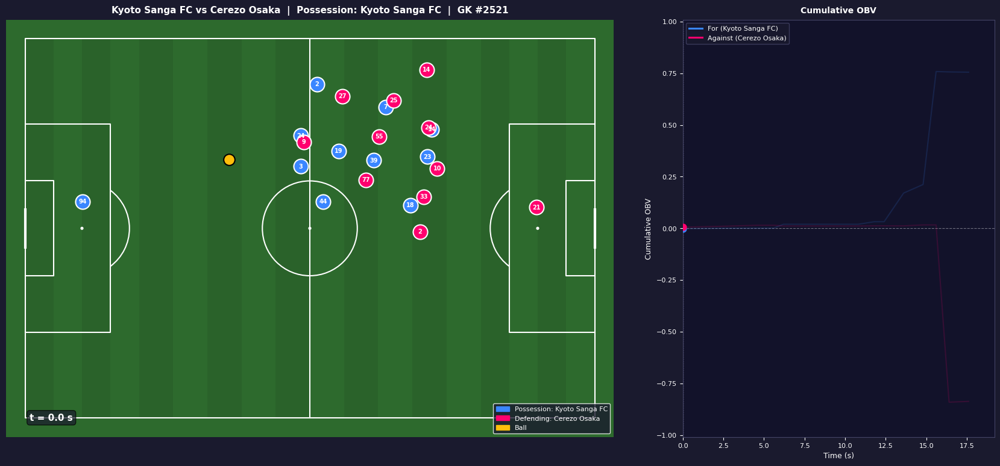

In [4]:
FPS          = 10
BALL_TRAIL   = 20
PLAYER_TRAIL = 8
POSS_COLOR   = '#3a86ff'
DEF_COLOR    = '#ff006e'
BALL_COLOR   = '#ffbe0b'

plt.rcParams['animation.embed_limit'] = 100  # MB

# ── Figure: pitch (left, wider) + OBV chart (right) ──────────────────────────
fig = plt.figure(figsize=(22, 9), facecolor='#1a1a2e')
gs  = gridspec.GridSpec(1, 2, width_ratios=[2.2, 1], wspace=0.06)

pitch    = Pitch(pitch_type='statsbomb', pitch_color='#2d6a2d',
                 line_color='white', stripe=True, stripe_color='#2a622a', linewidth=1.5)
ax_pitch = fig.add_subplot(gs[0])
pitch.draw(ax=ax_pitch)

ax_obv = fig.add_subplot(gs[1])
ax_obv.set_facecolor('#12122a')
for spine in ax_obv.spines.values():
    spine.set_color('#444466')
ax_obv.tick_params(colors='white', labelsize=8)
ax_obv.set_xlabel('Time (s)', color='white', fontsize=9)
ax_obv.set_ylabel('Cumulative OBV', color='white', fontsize=9)
ax_obv.set_title('Cumulative OBV', color='white', fontsize=10, fontweight='bold', pad=8)
ax_obv.set_xlim(0, rel_times[-1])
obv_margin = max(0.02, events[['cum_for', 'cum_against']].abs().max().max() * 1.2)
ax_obv.set_ylim(-obv_margin, obv_margin)
ax_obv.axhline(0, color='white', linewidth=0.8, alpha=0.4, linestyle='--')

# Static faded full lines for reference
ax_obv.plot(events['rel_t'], events['cum_for'],     color=POSS_COLOR, alpha=0.15, linewidth=1.5)
ax_obv.plot(events['rel_t'], events['cum_against'], color=DEF_COLOR,  alpha=0.15, linewidth=1.5)

# Dynamic growing lines
obv_line_for, = ax_obv.plot([], [], color=POSS_COLOR, linewidth=2.2, label=f'For ({poss_team})')
obv_line_agt, = ax_obv.plot([], [], color=DEF_COLOR,  linewidth=2.2, label=f'Against ({def_team})')
cursor_line   = ax_obv.axvline(0, color='white', linewidth=1, linestyle=':', alpha=0.7)
obv_dot_for   = ax_obv.scatter([], [], s=60, color=POSS_COLOR, zorder=5)
obv_dot_agt   = ax_obv.scatter([], [], s=60, color=DEF_COLOR,  zorder=5)
ax_obv.legend(fontsize=8, facecolor='#1a1a2e', labelcolor='white',
              edgecolor='#444466', loc='upper left')

# ── Pitch objects ─────────────────────────────────────────────────────────────
scat_poss = ax_pitch.scatter([], [], s=300, c=POSS_COLOR, edgecolors='white', linewidths=1.5, zorder=6)
scat_def  = ax_pitch.scatter([], [], s=300, c=DEF_COLOR,  edgecolors='white', linewidths=1.5, zorder=6)
scat_ball = ax_pitch.scatter([], [], s=180, c=BALL_COLOR, edgecolors='black',  linewidths=1.5, zorder=7)

jersey_texts = [ax_pitch.text(0, 0, '', ha='center', va='center',
                               fontsize=7, fontweight='bold', color='white', zorder=8)
                for _ in range(22)]

ball_trail_line, = ax_pitch.plot([], [], color=BALL_COLOR, linewidth=2,
                                  alpha=0.6, zorder=5, solid_capstyle='round')
trail_poss_sc = ax_pitch.scatter([], [], s=35, c=POSS_COLOR, alpha=0.2, edgecolors='none', zorder=4)
trail_def_sc  = ax_pitch.scatter([], [], s=35, c=DEF_COLOR,  alpha=0.2, edgecolors='none', zorder=4)

time_text = ax_pitch.text(
    1, 79, '', ha='left', va='top', fontsize=11, fontweight='bold', color='white',
    bbox=dict(boxstyle='round,pad=0.3', facecolor='#1a1a2e', alpha=0.7), zorder=10)

ax_pitch.set_title(
    f"{seq['home_team'].iloc[0]} vs {seq['away_team'].iloc[0]}  |  "
    f"Possession: {poss_team}  |  GK #{SAMPLE_ID}",
    color='white', fontsize=11, fontweight='bold', pad=8)

ax_pitch.legend(
    handles=[
        mpatches.Patch(color=POSS_COLOR, label=f'Possession: {poss_team}'),
        mpatches.Patch(color=DEF_COLOR,  label=f'Defending: {def_team}'),
        mpatches.Patch(color=BALL_COLOR, label='Ball'),
    ],
    loc='lower right', fontsize=8, facecolor='#1a1a2e', labelcolor='white', edgecolor='white')

# ── Precompute per-frame data ─────────────────────────────────────────────────
frame_data = {}
for fr in frames_sorted:
    fdf = seq[seq['frame'] == fr]
    frame_data[fr] = {
        'poss': fdf[fdf['is_home'] == poss_is_home][['px_sb', 'py_sb', 'jersey_number']].values,
        'def' : fdf[fdf['is_home'] != poss_is_home][['px_sb', 'py_sb', 'jersey_number']].values,
        'ball': fdf[['bx_sb', 'by_sb']].iloc[0].values,
    }

ball_hist = []

# ── Update function ───────────────────────────────────────────────────────────
def update(fi):
    fr    = frames_sorted[fi]
    fd    = frame_data[fr]
    rel_t = rel_times[fi]

    # Players
    if len(fd['poss']): scat_poss.set_offsets(fd['poss'][:, :2])
    if len(fd['def']):  scat_def.set_offsets(fd['def'][:, :2])

    # Jersey numbers
    all_players = list(fd['poss']) + list(fd['def'])
    for k, txt in enumerate(jersey_texts):
        if k < len(all_players):
            txt.set_position((all_players[k][0], all_players[k][1]))
            txt.set_text(str(int(all_players[k][2])) if not np.isnan(all_players[k][2]) else '')
        else:
            txt.set_text('')

    # Ball + trail
    scat_ball.set_offsets([fd['ball']])
    ball_hist.append(fd['ball'].copy())
    trail = ball_hist[max(0, len(ball_hist) - BALL_TRAIL):]
    if len(trail) >= 2:
        tx, ty = zip(*trail)
        ball_trail_line.set_data(tx, ty)

    # Player trails
    p_pts, d_pts = [], []
    for pfi in range(max(0, fi - PLAYER_TRAIL), fi):
        pfd = frame_data[frames_sorted[pfi]]
        p_pts.extend(pfd['poss'][:, :2].tolist())
        d_pts.extend(pfd['def'][:, :2].tolist())
    if p_pts: trail_poss_sc.set_offsets(p_pts)
    if d_pts: trail_def_sc.set_offsets(d_pts)

    # HUD
    time_text.set_text(f't = {rel_t:.1f} s')

    # OBV chart
    past = events[events['rel_t'] <= rel_t]
    if not past.empty:
        obv_line_for.set_data(past['rel_t'], past['cum_for'])
        obv_line_agt.set_data(past['rel_t'], past['cum_against'])
        last = past.iloc[-1]
        obv_dot_for.set_offsets([[last['rel_t'], last['cum_for']]])
        obv_dot_agt.set_offsets([[last['rel_t'], last['cum_against']]])
    cursor_line.set_xdata([rel_t, rel_t])

    return (scat_poss, scat_def, scat_ball, ball_trail_line,
            trail_poss_sc, trail_def_sc, time_text,
            obv_line_for, obv_line_agt, obv_dot_for, obv_dot_agt,
            cursor_line, *jersey_texts)

anim2 = FuncAnimation(fig, update, frames=len(frames_sorted),
                       interval=1000 / FPS, blit=True)
print(f'Animation ready — {len(frames_sorted)} frames at {FPS} fps')

## Display animation

In [5]:
plt.close(fig)
HTML(anim2.to_jshtml(fps=FPS, default_mode='loop'))

## (Optional) Save as GIF

In [6]:
# Uncomment to save
# anim2.save('goal_kick_animation2.gif', writer='pillow', fps=FPS)
# print('Saved.')